# Logistic model fit to oak data with sproc

HYBRID-DATA: https://docs.google.com/spreadsheets/d/13tOQniYpGp0Zhy-fvAiG-SRBLrSnSnK5DNfWhPztEzk/edit?usp=sharing

In [1]:
import itertools
import pandas as pd
import numpy as np
import toytree
import toyplot
import pymc3 as pm

In [2]:
toyplot.config.autoformat = "png"

### Load tree and assign tips to clades

In [3]:
# exclude samples for reason xyz...
EXCLUDE = [
    'Quercus|Quercus|Leucomexicana|Q.species', 
    'Quercus|Quercus|Roburoids|Q.vulcanica',
    'Quercus|Quercus|Roburoids|Q.imeretina', 
    'Quercus|Virentes|nan|Q.sagraeana',
    'Quercus|Lobatae|Erythromexicana|Q.lowilliamsii', 
    'Quercus|Lobatae|Agrifoliae|Q.oxyadenia', 
    'Quercus|Quercus|Roburoids|Q.kotschyana',
    'Quercus|Quercus|Roburoids|Q.cedrorum', 
    'Quercus|Quercus|Dumosae|Q.pacifica',
    'Quercus|Lobatae|Erythromexicana|Q.sartorii',
    'Quercus|Lobatae|Agrifoliae|Q.tamalpaiensis',
    'Quercus|Lobatae|Agrifoliae|Q.shrevei',
    'Cerris|Cyclobalanopsis|Semiserrata|Q.litoralis', 
    'Cerris|Cyclobalanopsis|Acuta|Q.ciliaris', 
    'Cerris|Cyclobalanopsis|Acuta|Q.stewardiana',
    'Cerris|Cyclobalanopsis|Semiserrata|Q.patelliformis',
    'Cerris|Cyclobalanopsis|Glauca|Q.multinervis', 
    'Cerris|Ilex|Himalayansubalpine|Q.sp.nov.',
]

In [4]:
# Load chronos scaled tree
TREE = toytree.tree("../full_crown.tre")

# drop exclude samples
TREE = TREE.drop_tips(EXCLUDE)

# find duplicates (label ends in 1 or 2, we'll drop the 2)
DUPS = [i for i in TREE.get_tip_labels() if i.endswith('2')]
TREE = TREE.drop_tips(DUPS)

# relabel kept duplicate tips by stripping 1 from end
TREE = TREE.set_node_values(
    feature="name", 
    values={nidx: TREE.idx_dict[nidx].name.strip("1") for nidx in TREE.idx_dict}
)

# Scale tree to 1.0 length
TREE = TREE.mod.node_scale_root_height(1.0)

In [5]:
# Get crown nodes for eight clades.
clades = [
    "Quercus|Quercus",
    "Quercus|Virentes",
    "Quercus|Ponticae",
    "Quercus|Protobalanus",
    "Quercus|Lobatae",
    "Cerris|Cyclobalanopsis",
    "Cerris|Ilex",
    "Cerris|Cerris",
]
crowns = {
    TREE.get_mrca_idx_from_tip_labels(wildcard=i): i for i in clades
}
crowns

{410: 'Quercus|Quercus',
 411: 'Quercus|Virentes',
 424: 'Quercus|Ponticae',
 437: 'Quercus|Protobalanus',
 445: 'Quercus|Lobatae',
 447: 'Cerris|Cyclobalanopsis',
 440: 'Cerris|Ilex',
 441: 'Cerris|Cerris'}

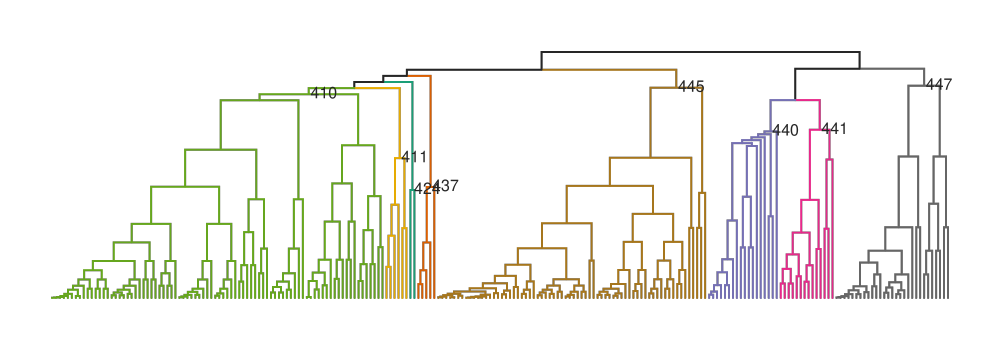

In [13]:
# draw the tree
TREE.draw(
    layout='d', 
    edge_colors=TREE.get_edge_values_mapped(set(crowns)),
    tip_labels=False,
    height=350,
    node_labels=[
        str(i) if int(i) in crowns else "" 
        for i in TREE.get_node_values("idx", 1, 1)
    ],
    node_labels_style={
        "font-size": "16px",
        "-toyplot-anchor-shift": "15px",
    },
);

### Load hybrid crossing data

In [15]:
# load datasets
data = pd.read_csv('../csv-files/oaks-hyrids-4-25-21.csv')
data = data.loc[data.exclude != 1, :]
data

,speciesA,speciesB,author,datatype,hybrid,exclude,notes,overlap,records
0,alba,bicolor,Trelease 1917,morphology,1,NaN,NaN,NaN,NaN
1,alba,macrocarpa,Trelease 1917,morphology,1,NaN,NaN,NaN,NaN
2,alba,montana,Trelease 1917,morphology,1,NaN,NaN,NaN,NaN
3,alba,muhlenbergii,Trelease 1917,morphology,1,NaN,NaN,NaN,NaN
4,alba,prinoides,Trelease 1917,morphology,1,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
1809,fusiformis,glabrescens,sproc,sproc,0,NaN,NaN,NaN,NaN
1810,fusiformis,rugosa,sproc,sproc,0,NaN,NaN,NaN,NaN
1811,fusiformis,greggii,sproc,sproc,0,NaN,NaN,NaN,NaN
1812,fusiformis,diversifolia,sproc,sproc,0,NaN,NaN,NaN,NaN


In [16]:
# record RI as inverse of hybrid
data["RI"] = abs(data.hybrid - 1)

# subsample to relevant columns
data = data.loc[:, ["speciesA", "speciesB", "RI"]]

In [17]:
# order names alphabetically
for idx in data.index:
    if data.speciesA[idx] > data.speciesB[idx]:
        _a = data.loc[idx, 'speciesA']
        _b = data.loc[idx, 'speciesB']
        data.loc[idx, 'speciesA'] = _b
        data.loc[idx, 'speciesB'] = _a

In [18]:
# remove any duplicated records
data = data.drop_duplicates(subset=['speciesA', 'speciesB'])

In [19]:
# translate tip names in data to idx in TREE (sidx)
transform = {
    TREE.idx_dict[nidx].name.split("|")[-1][2:]: nidx 
    for nidx in TREE.idx_dict 
    if TREE.idx_dict[nidx].is_leaf()
}
data['sidx0'] = [transform.get(i, pd.NA) for i in data.speciesA.tolist()]
data['sidx1'] = [transform.get(i, pd.NA) for i in data.speciesB.tolist()]

In [20]:
data.head()

,speciesA,speciesB,RI,sidx0,sidx1
0,alba,bicolor,0,52,47
1,alba,macrocarpa,0,52,49
2,alba,montana,0,52,54
3,alba,muhlenbergii,0,52,<NA>
4,alba,prinoides,0,52,51


#### TODO:

<div class="alert alert-warning">
I fixed about 20 typos in species names in a new copy of the <a href=https://docs.google.com/spreadsheets/d/13tOQniYpGp0Zhy-fvAiG-SRBLrSnSnK5DNfWhPztEzk/edit#gid=0)>hybrid spreadsheet</a>, but there's a lot more to do. See the names below which still do not match between the phylogeny and the data. These may have synonyms recorded somewhere, or they may have typos. They need to be checked. I also added a new citation at the end of the spreadsheet that I found when searching laurifolia, which is a synonym for obtusa, and is itself maybe a hybrid.

</div>

In [21]:
# drop any rows that have NA (species not in TREE)
missing = set(data.speciesA[data.sidx0.isna()].unique())
missing.update(set(data.speciesB[data.sidx1.isna()].unique()))
missing

{'catesbaei',
 'coccolobifolia',
 'cornelius‐mulleri',
 'cuneata',
 'depressipes',
 'dunnii',
 'durandii',
 'gambelii',
 'husitanica',
 'laurifoliia',
 'liaotungensis',
 'margarettaee',
 'muhlenbergii',
 'nuttallii',
 'parvula',
 'pyrenica',
 'rubramenta',
 'sagraeana',
 'tarahumara',
 'tormentella',
 'undulata'}

In [22]:
# drop any rows containing an NA value
data = data.loc[data.sidx0.notna() & data.sidx1.notna(), :].reset_index(drop=True)
data.sidx0 = data.sidx0.astype(int)
data.sidx1 = data.sidx1.astype(int)

In [23]:
# get 1-scaled genetic distances between pairs
def get_dist(tree, idx0, idx1):
    "returns the genetic distance between two nodes on a tree"
    dist = tree.treenode.get_distance(
        tree.idx_dict[idx0], 
        tree.idx_dict[idx1],
    )
    return dist

data['dist'] = [get_dist(TREE, i, j) / 2 for (i, j) in zip(data.sidx0, data.sidx1)]

In [24]:
# add RI=0 for all within-species comparisons
idx = data.shape[0]
for nidx in range(TREE.ntips):
    node = TREE.idx_dict[nidx]
    name = node.name.split("|")[-1][2:]
    data.loc[idx] = name, name, 0, nidx, nidx, 0.0
    idx += 1

In [25]:
data

,speciesA,speciesB,RI,sidx0,sidx1,dist
0,alba,bicolor,0,52,47,0.401786
1,alba,macrocarpa,0,52,49,0.401786
2,alba,montana,0,52,54,0.200893
3,alba,prinoides,0,52,51,0.401786
4,alba,stellata,0,52,33,0.602679
...,...,...,...,...,...,...
1932,rex,rex,0,221,221,0.000000
1933,chungii,chungii,0,222,222,0.000000
1934,delavayi,delavayi,0,223,223,0.000000
1935,championii,championii,0,224,224,0.000000


In [26]:
# make group index (gidx)
crown_dict = {i: TREE.get_tip_labels(i) for i in crowns}
gidx = np.zeros(TREE.ntips, dtype=int)
for tidx, tip in enumerate(TREE.get_tip_labels()):
    for cidx, clade in enumerate(crown_dict):
        if tip in crown_dict[clade]:
            gidx[tidx] = cidx
gidx

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 2, 2, 3, 3, 3, 3, 3, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6, 6,
       6, 6, 6, 6, 6, 6, 6, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 5,
       5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5, 5,
       5, 5, 5, 5, 5, 5])

### VISUALIZE THE HYBRID CROSSING DATA

In [27]:
def heatmap_plot(TREE, CLADES, data, **kwargs):
    """
    Sanity check: does the data make sense?
    """
    # get canvas size
    canvas = toyplot.Canvas(
        width=kwargs.get('width', 600),
        height=kwargs.get('height', 600),
    );

    # add tree to canvas
    ax0 = canvas.cartesian(
        bounds=("5%", "25%", "5%", "95%"),
        show=False
    )
    TREE.draw(
        axes=ax0, 
        layout='r', 
        tip_labels=False,
        edge_colors=TREE.get_edge_values_mapped({
            j: toytree.colors[i] for i,j in enumerate(CLADES)
        })
    )
    NSPECIES = TREE.ntips

    # add heatmap to canvas
    ax1 = canvas.table(
        rows=NSPECIES, 
        columns=NSPECIES, 
        bounds=("27%", "95%", "5%", "95%"),
        margin=20
    )
    ax1.cells.cell[:].style = {
        "fill": 'lightgrey',
        "stroke": "none"
    }

    # set values for data
    for idx in data.index:
        ridx, cidx = data.loc[idx, ['sidx0', 'sidx1']]
        rridx = NSPECIES - ridx - 1
        ccidx = NSPECIES - cidx - 1
        ridx, cidx, rridx, ccidx = [
            int(i) for i in (ridx, cidx, rridx, ccidx)
        ]

        # get RI for this cell
        value = data.loc[idx, 'RI']
        if value:
            color = "red"
        else:
            color = "black"
        
        ax1.cells.cell[rridx, cidx].style = {
            "fill": color,
            "stroke": "none"
        }
        ax1.cells.cell[ccidx, ridx].style = {
            "fill": color,
            "stroke": "none"
        }

    # dividers
    ax1.body.gaps.columns[...] = 0.
    ax1.body.gaps.rows[...] = 0.
    
    return canvas

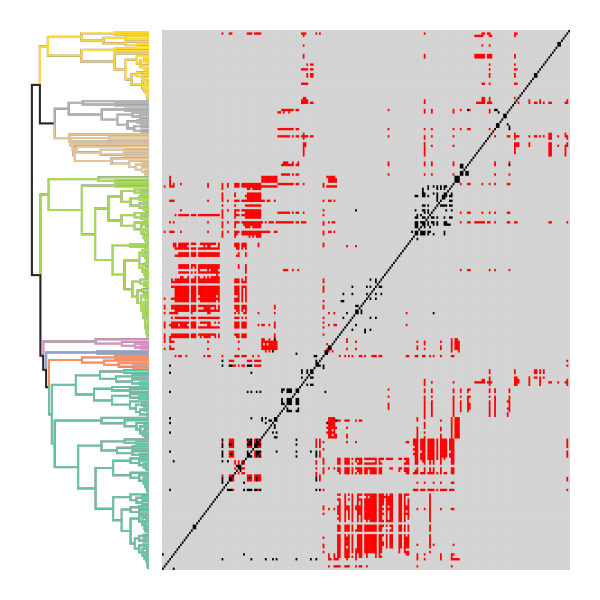

In [28]:
heatmap_plot(TREE, crown_dict, data)

In [29]:
def dist_RI_scatterplot(TREE, data, jitter=0.01):
    """
    Scatterplot of RI values x genetic dist with the 
    genetic distance values jittered slightly to show
    more clearly despite overlap.
    """
    canvas = toyplot.Canvas(width=300, height=300)
    axes = canvas.cartesian(
        xlabel="Genetic dist.",
        ylabel="Reproductive isolation",
    )
    ns = sum(data.RI == 0)
    xs = data.dist[data.RI == 0] + np.random.uniform(-jitter, jitter, size=ns)
    xs[xs > 1] = 1
    xs[xs < 0] = 0    
    mark = axes.scatterplot(
        xs,
        data.RI[data.RI == 0],
        size=10,
        opacity=0.1,
        marker="|",
        mstyle={
            "stroke": 'black',
            "stroke-width": 3,
        },
    );
    ns = sum(data.RI == 1)
    xs = data.dist[data.RI == 1] + np.random.uniform(-jitter, jitter, size=ns)
    xs[xs > 1] = 1
    xs[xs < 0] = 0
    mark = axes.scatterplot(
        xs,
        data.RI[data.RI == 1],
        size=10,
        opacity=0.1,
        marker="|",
        mstyle={
            "stroke": 'red',
            "stroke-width": 3,
        },
    );
    axes.x.ticks.show = True
    axes.y.ticks.show = True
    return canvas, axes, mark

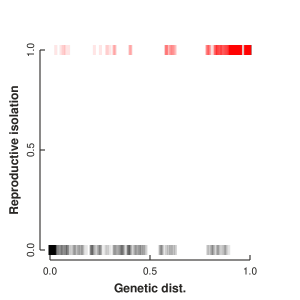

In [30]:
dist_RI_scatterplot(TREE, data, jitter=0.025);

In [31]:
data[data.RI == 0].sort_values(by='dist', ascending=False).head(10)

,speciesA,speciesB,RI,sidx0,sidx1,dist
122,cedrosensis,engelmannii,0,96,62,0.902643
169,pontica,robur,0,90,74,0.877875
168,garryana,sadleriana,0,61,91,0.877875
80,stellata,virginiana,0,33,85,0.853107
96,margarettae,virginiana,0,37,85,0.853107
154,turbinella,virginiana,0,4,85,0.853107
95,austrina,virginiana,0,38,85,0.853107
66,macrocarpa,virginiana,0,49,85,0.853107
40,bicolor,virginiana,0,47,85,0.853107
62,lyrata,virginiana,0,48,85,0.853107


### Fit models

In [32]:
def toytrace(trace, var_names, titles):
    """
    Plot posterior trace with toyplot
    """
    nvars = len(var_names)
    
    # setup canvase
    canvas = toyplot.Canvas(width=500, height=200 * nvars)
    
    # store axes
    axes = []
    
    # iter over params
    for pidx, param in enumerate(var_names):
        
        # get param posterior
        posterior = trace.get_values(param)
        
        # setup axes 
        ax = canvas.cartesian(grid=(nvars, 1, pidx))
        ax.y.show = False
        ax.x.spine.style = {"stroke-width": 1.5}
        ax.x.ticks.labels.style = {"font-size": "12px"}
        ax.x.ticks.show = True
        ax.x.label.text = f"param='{titles[pidx]}'"        
        
        # iterate over shape of param
        for idx in range(posterior.shape[1]):
            mags, bins = np.histogram(posterior[:, idx], bins=100)
            ax.plot(bins[1:], mags, stroke_width=2, opacity=0.6)
        axes.append(ax)
    return canvas, axes

In [71]:
def partpooled_logistic(x, y, idx0, idx1, gidx, **kwargs):
    
    # define model
    with pm.Model() as model:
        
        # indexers
        sidx0 = pm.Data("spp_idx0", idx0)
        sidx1 = pm.Data("spp_idx1", idx1)
        gidx = pm.Data("gidx", gidx)

        # parameters and error
        𝜓_mean = pm.Normal('𝜓_mean', mu=0., sigma=5., shape=len(crowns))
        𝜓_std = pm.HalfNormal('𝜓_std', 5., shape=len(crowns))
        𝜓_offset = pm.Normal('𝜓_offset', mu=0, sigma=1., shape=TREE.ntips)
        𝜓 = pm.Deterministic('𝜓', 𝜓_mean[gidx] + 𝜓_std[gidx] * 𝜓_offset)
        𝛽 = pm.Normal('𝛽', mu=0., sigma=5., shape=1)
        𝛼 = pm.Normal('𝛼', mu=0., sigma=1., shape=1)
        
        # linear model prediction
        logit = pm.invlogit(𝛼 + (𝛽 + 𝜓[sidx0] + 𝜓[sidx1]) * x)
        #effect = 𝛼 + (𝛽 + 𝜓[sidx0] + 𝜓[sidx1]) * x
        #logit = pm.Deterministic("logit", pm.invlogit(effect))
        
        # data likelihood (normal distributed errors)
        y_like = pm.Bernoulli("y", p=logit, observed=y)
        
        # sample posterior, skip burnin
        trace = pm.sample(**kwargs)[1000:]

        # show summary table
        stats = pm.summary(trace)
        
    # organize results
    result_dict = {
        'model': model, 
        'trace': trace,
        'stats': stats,
    }
    return result_dict

In [73]:
# MCMC sampler kwargs
sample_kwargs = dict(
    tune=4000,
    draws=4000,
    target_accept=0.95,
    return_inferencedata=False,
    progressbar=True,
)

In [74]:
# model input
model_args = [
    data.dist,
    data.RI,
    data.sidx0,
    data.sidx1,
    gidx,
]

In [75]:
# fit model and get dict of results, including trace
results = partpooled_logistic(*model_args, **sample_kwargs)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [𝛼, 𝛽, 𝜓_offset, 𝜓_std, 𝜓_mean]


Sampling 4 chains for 4_000 tune and 4_000 draw iterations (16_000 + 16_000 draws total) took 253 seconds.
The number of effective samples is smaller than 25% for some parameters.


In [82]:
results['stats'].head(10)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
𝜓_mean[0],1.697,1.627,-1.205,4.925,0.030,0.021,2873.0,4936.0,1.0
𝜓_mean[1],-1.147,2.391,-5.559,3.410,0.040,0.028,3648.0,5793.0,1.0
𝜓_mean[2],-1.875,2.821,-7.258,3.490,0.040,0.028,4958.0,6445.0,1.0
𝜓_mean[3],3.893,2.717,-0.958,9.230,0.036,0.025,5631.0,7563.0,1.0
𝜓_mean[4],2.010,1.582,-1.013,4.961,0.030,0.021,2830.0,4939.0,1.0
𝜓_mean[5],6.112,3.080,0.614,12.010,0.034,0.025,8357.0,8083.0,1.0
𝜓_mean[6],3.773,2.446,-0.816,8.283,0.036,0.025,4589.0,6880.0,1.0
𝜓_mean[7],1.626,2.057,-2.092,5.647,0.033,0.023,3910.0,6208.0,1.0
𝜓_offset[0],-0.003,1.004,-1.813,1.962,0.008,0.009,14655.0,9230.0,1.0
𝜓_offset[1],0.238,0.863,-1.366,1.868,0.008,0.008,12849.0,8253.0,1.0


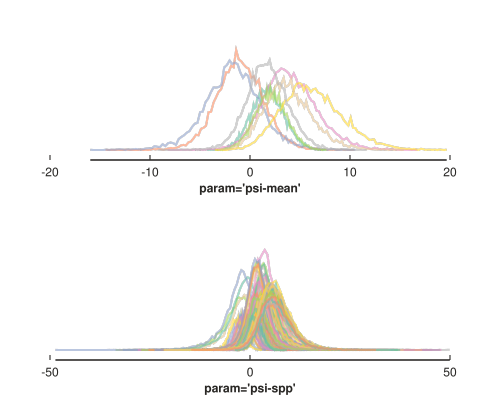

In [83]:
toytrace(results['trace'], ['𝜓_mean', '𝜓'], ['psi-mean', 'psi-spp']);

In [84]:
import scipy.stats as stats

def draw_velocity_dists(trace, baseline=0.15):
    """
    Draw the clade velocities as gaussians
    """
    canvas = toyplot.Canvas(width=350, height=300)
    axes = canvas.cartesian(xlabel="Relative velocity of reproductive isolation")
    marks = []
    base = 0
    for i in range(trace['𝜓_mean'].shape[1]):
        
        loc = trace['𝜓_mean'][:, i].mean()
        scale = trace['𝜓_std'][:, i].mean()
        interval = stats.norm.interval(0.995, loc, scale)
        points = np.linspace(interval[0], interval[1], 100)
        mark = axes.fill(
            points, 
            stats.norm.pdf(points, loc=loc, scale=scale), 
            style={
                "fill-opacity": 0.45,
                "stroke": 'black',
                "stroke-opacity": 1.0,
                "stroke-width": 1,
            },
            baseline=np.repeat(base, 100),
        )
        marks.append(mark)
        axes.hlines(base, style={"stroke-dasharray": "5,5", 'stroke-width': 1})
        base += baseline
        
    axes.y.show = False
    axes.x.ticks.locator = toyplot.locator.Extended(only_inside=True)
    axes.x.ticks.show = True
    return canvas, axes, marks

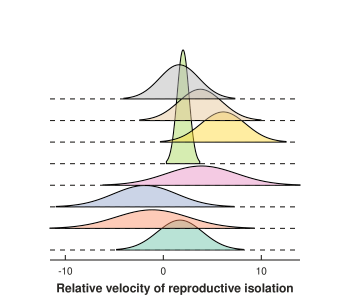

In [85]:
draw_velocity_dists(results['trace'], baseline=0.125);

### RESULT FIGURES

In [87]:
results['trace'].varnames

['𝜓_mean', '𝜓_std_log__', '𝜓_offset', '𝛽', '𝛼', '𝜓_std', '𝜓']

In [91]:
a, b = zip(*itertools.combinations(range(TREE.ntips), 2))
post = pd.DataFrame({
    "sidx0": a,
    "sidx1": b,
    "dist": [get_dist(TREE, i, j) / 2. for (i, j) in zip(a, b)],
})
psi_means = results['trace']['𝜓'].mean(axis=0)
post["RI"] = (
    results['trace']['𝛼'].mean() + [
        results['trace']['𝛽'].mean() + psi_means[i] + psi_means[j] 
        for (i, j) in zip(a, b)
    ] * post['dist']
)
post["RI"] = 1 / (1 + np.exp(-(post["RI"])))
post.head()

,sidx0,sidx1,dist,RI
0,0,1,0.001046,-4.954617
1,0,2,0.002093,-4.943171
2,0,3,0.004185,-4.919001
3,0,4,0.008371,-4.899195
4,0,5,0.016741,-4.765271


In [135]:
def dist_RI_results_scatterplot(data, jitter=0.01):
    """
    Scatterplot of RI values x genetic dist with the 
    genetic distance values jittered slightly to show
    more clearly despite overlap.
    """
    canvas = toyplot.Canvas(width=300, height=300)
    axes = canvas.cartesian(
        label="logit sigmoid function fit to data",
        xlabel="Genetic distance",
        ylabel="Probability of RI",
    )
    mark = axes.scatterplot(
        data.dist + np.random.uniform(-jitter, jitter, size=data.dist.size),
        data.RI,
        size=8,
        opacity=0.1,
        mstyle={
            "stroke": "none",
            "fill": '#262626',
            "fill-opacity": 0.33,
        },
    );
    axes.x.ticks.show = True
    axes.y.ticks.show = True
    return canvas, axes, mark

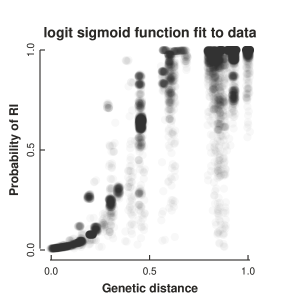

In [136]:
dist_RI_results_scatterplot(post);

In [140]:
def heat_results_plot(TREE, CLADES, results):
    
    # get canvas size
    canvas = toyplot.Canvas(width=500, height=500);

    # colormap for values between 0-1
    cmap_lower = toyplot.color.LinearMap(
        domain_min=results.RI.min(), 
        domain_max=results.RI.max()
    )

    # add tree to canvas
    ax0 = canvas.cartesian(
        bounds=("5%", "25%", "5%", "95%"),
        show=False
    )
    TREE.draw(
        axes=ax0, 
        layout='r', 
        tip_labels=False,
        edge_colors=TREE.get_edge_values_mapped({
            j: toytree.colors[i] for i,j in enumerate(CLADES)
        })
    )
    NSPECIES = TREE.ntips

    # add heatmap to canvas
    ax1 = canvas.table(
        rows=NSPECIES, 
        columns=NSPECIES, 
        bounds=("27%", "88%", "5%", "95%"),
        margin=20
    )
    ax1.cells.cell[:].style = {
        "fill": 'lightgrey',
        "stroke": "none"
    }

    # set values for data
    for idx in results.index:
        ridx, cidx = results.loc[idx, ['sidx0', 'sidx1']]
        rridx = NSPECIES - ridx - 1
        ccidx = NSPECIES - cidx - 1
        ridx, cidx, rridx, ccidx = [
            int(i) for i in (ridx, cidx, rridx, ccidx)
        ]

        # get RI for this cell
        value = results.at[idx, 'RI']
        
        # fill below diagonal with logit
        ax1.cells.cell[rridx, cidx].style = {
            "fill": cmap_lower.color(value),
            "stroke": "none"
        }
        
        # randomly sample RI using logit probability for color
        if np.random.binomial(1, results.at[idx, "RI"]):
            fill = "white"
        else:
            fill = "black"

        # fill above diagonal with sampled RI 
        ax1.cells.cell[ccidx, ridx].style = {
            "fill": fill,
            "stroke": "none"
        }

    for idx in range(NSPECIES):
        ax1.cells.cell[NSPECIES - idx - 1, idx].style = {
            "fill": cmap_lower.color(0),
            "stroke": "none"
        }

    # dividers
    ax1.body.gaps.columns[...] = 0.0
    ax1.body.gaps.rows[...] = 0.0
    
    # add a colorbar
    numberline = canvas.numberline("92%", "95%", "92%", "5%")
    numberline.colormap(cmap_lower, style={"stroke-width": 5})

    return canvas

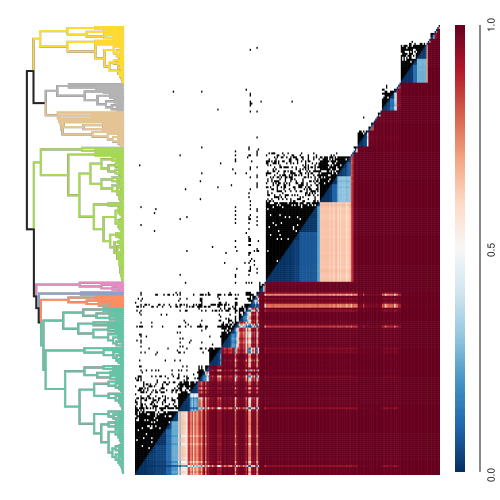

In [141]:
heat_results_plot(TREE, crowns, post)

### Rates on tree
This figure could be made much prettier...

In [142]:
psi_means = results['trace']['𝜓'].mean(axis=0)

In [155]:
def plot_tree_rates(TREE, CLADES, values,  **kwargs):
    
    # get canvas size
    canvas = toyplot.Canvas(
        width=kwargs.get('width', 500),
        height=kwargs.get('height', 500),
    )
    
    # colormap for values between 0-1
    cmap_lower = toyplot.color.LinearMap(
        domain_min=values.min(), 
        domain_max=values.max()
    )
    
    # add tree to canvas
    ax0 = canvas.cartesian(
        bounds=("10%", "40%", "5%", "85%"),
        show=False
    )
    TREE.draw(
        axes=ax0, 
        layout='r', 
        tip_labels=False,
        edge_colors=TREE.get_edge_values_mapped({
            j: toytree.colors[i] for i,j in enumerate(CLADES)
        })
    )
    NSPECIES = TREE.ntips
    
    ax1 = canvas.cartesian(
        bounds=("45%", "90%", "5%", "85%"),
        yshow=False,
        xlabel="RI velocity",
    )
    ax1.scatterplot(
        values, 
        np.arange(TREE.ntips),
        mstyle={"fill": 'black', 'stroke': 'none'},
    )    
    ax1.x.ticks.show = True
    
    return canvas, (ax0, ax1)

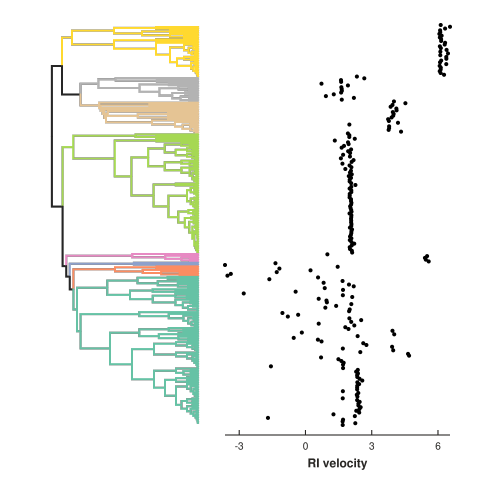

In [156]:
plot_tree_rates(TREE, crowns, psi_means);